# <center> 👉 class_12_2 » _Face Recognition with Yale Face Data_ </center>

# Face Recognition with CNN (using Dlib)

- In this section, we will use Convolutional Neural Network(CNN) to perform face recognition.
- It is much more accurate than LBPH algorithms, but slower.

## 1. Google Drive Mount & Image Datasets Loading

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
import zipfile

yalefaces_path = './images/CV/Yale_Face.zip'
# yalefaces_path = '/content/drive/MyDrive/colab/Computer-Vision-Course/Data/Datasets/yalefaces.zip'

zip = zipfile.ZipFile(file=yalefaces_path, mode='r')
zip.extractall('./')  # extract all file in current directory
zip.close()

- The Yale Face Database (size 6.4MB) contains 165 grayscale images in GIF format of 15 individuals. 
- There are 11 images per subject, one per different facial expression or configuration: center-light, w/glasses, happy, left-light, w/no glasses, normal, right-light, sad, sleepy, surprised, and wink.

In [2]:
import os

train_image_path = './images/CV/Yale_Face/train'

# print all train image file name
all_train_image_file_name = os.listdir(train_image_path)
print(all_train_image_file_name)

['subject01.centerlight', 'subject01.glasses', 'subject01.leftlight', 'subject01.rightlight', 'subject01.sad', 'subject01.sleepy', 'subject01.surprised', 'subject01.wink', 'subject02.centerlight', 'subject02.glasses', 'subject02.happy', 'subject02.leftlight', 'subject02.noglasses', 'subject02.rightlight', 'subject02.sleepy', 'subject02.wink', 'subject03.glasses', 'subject03.happy', 'subject03.noglasses', 'subject03.rightlight', 'subject03.sad', 'subject03.sleepy', 'subject03.surprised', 'subject03.wink', 'subject04.centerlight', 'subject04.glasses', 'subject04.noglasses', 'subject04.rightlight', 'subject04.sad', 'subject04.sleepy', 'subject04.surprised', 'subject04.wink', 'subject05.centerlight', 'subject05.glasses', 'subject05.happy', 'subject05.leftlight', 'subject05.sad', 'subject05.sleepy', 'subject05.surprised', 'subject05.wink', 'subject06.centerlight', 'subject06.glasses', 'subject06.happy', 'subject06.leftlight', 'subject06.rightlight', 'subject06.sad', 'subject06.surprised', '

In [3]:
all_train_image_paths = [os.path.join(train_image_path, f) for f in all_train_image_file_name]
print(all_train_image_paths)

['./images/CV/Yale_Face/train\\subject01.centerlight', './images/CV/Yale_Face/train\\subject01.glasses', './images/CV/Yale_Face/train\\subject01.leftlight', './images/CV/Yale_Face/train\\subject01.rightlight', './images/CV/Yale_Face/train\\subject01.sad', './images/CV/Yale_Face/train\\subject01.sleepy', './images/CV/Yale_Face/train\\subject01.surprised', './images/CV/Yale_Face/train\\subject01.wink', './images/CV/Yale_Face/train\\subject02.centerlight', './images/CV/Yale_Face/train\\subject02.glasses', './images/CV/Yale_Face/train\\subject02.happy', './images/CV/Yale_Face/train\\subject02.leftlight', './images/CV/Yale_Face/train\\subject02.noglasses', './images/CV/Yale_Face/train\\subject02.rightlight', './images/CV/Yale_Face/train\\subject02.sleepy', './images/CV/Yale_Face/train\\subject02.wink', './images/CV/Yale_Face/train\\subject03.glasses', './images/CV/Yale_Face/train\\subject03.happy', './images/CV/Yale_Face/train\\subject03.noglasses', './images/CV/Yale_Face/train\\subject03.r

## 2. Pre-process the Images

In [ ]:
import cv2
# from google.colab.patches import cv2_imshow

In [4]:
os.path.split(all_train_image_paths[0])

('./images/CV/Yale_Face/train', 'subject01.centerlight')

In [5]:
import numpy as np
from PIL import Image

def fetch_preprocessed_image_data(image_paths):
    face_images = []
    ids_of_image = []

    for image_path in image_paths:
        image = Image.open(image_path).convert('L')  # convert to grayscale
        image_np = np.array(image, 'uint8')  # convert the image type to a numpy array type (with integer format)
        image_file_name = os.path.split(image_path)[1]
        id_of_image = int(image_file_name.split('.')[0].replace('subject', ''))
        ids_of_image.append(id_of_image)
        face_images.append(image_np)

    return np.array(ids_of_image), face_images

In [6]:
ids_of_train_image, faces_of_train_image = fetch_preprocessed_image_data(all_train_image_paths)

In [7]:
ids_of_train_image

array([ 1,  1,  1,  1,  1,  1,  1,  1,  2,  2,  2,  2,  2,  2,  2,  2,  3,
        3,  3,  3,  3,  3,  3,  3,  4,  4,  4,  4,  4,  4,  4,  4,  5,  5,
        5,  5,  5,  5,  5,  5,  6,  6,  6,  6,  6,  6,  6,  6,  7,  7,  7,
        7,  7,  7,  7,  7,  8,  8,  8,  8,  8,  8,  8,  8,  9,  9,  9,  9,
        9,  9,  9,  9, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11,
       11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13,
       13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15,
       15, 15, 15, 15, 15, 15])

In [8]:
faces_of_train_image[0]

array([[130, 130, 130, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [ 68,  68,  68, ...,  68,  68,  68]], dtype=uint8)

In [9]:
faces_of_train_image[0].shape

(243, 320)

In [10]:
len(ids_of_train_image), len(faces_of_train_image)

(125, 125)

## 3. Detect Facial Points with sample img data

In [11]:
import dlib

face_detector = dlib.get_frontal_face_detector()

# A predictor that detect faces based on 68 key features of faces
points_68_detector = dlib.shape_predictor('./cv_data/shape_predictor_68_face_landmarks.dat')

# A predictor that detect faces based on only 5 key features of faces
points_5_detector = dlib.shape_predictor('./cv_data/shape_predictor_5_face_landmarks.dat')

- __`points_68_detector`__ which finds 68 features in the face then detects the face, is slower than __`points_5_detector`__ which detects the face based on 5 features, but has better performance.
- __`points_5_detector`__ is sometimes used when it needs to be fast like a mobile application.

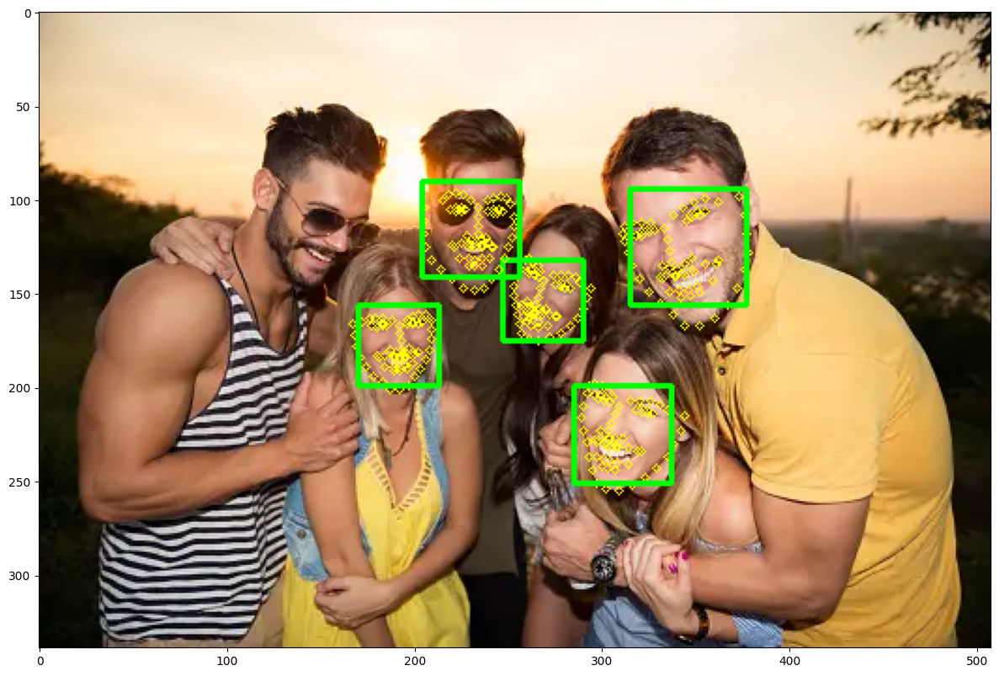

In [15]:
import cv2
import numpy as np

from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
figure(figsize=(15, 10), dpi=100)

image = cv2.imread('./images/CV/people1.webp')

face_detections = face_detector(image, 1)

for face_detection in face_detections:
    face_points = points_68_detector(image, face_detection) 
    for face_point in face_points.parts():
        cv2.circle(image, (face_point.x, face_point.y), 2, (0, 255, 255))
        left, top, right, bottom = face_detection.left(), face_detection.top(), face_detection.right(), face_detection.bottom()
        cv2.rectangle(image, (left, top), (right, bottom), (0, 255, 0), 2)

# cv2_imshow(image)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

In [16]:
face_points.parts()

points[(205, 104), (205, 111), (205, 118), (206, 125), (209, 132), (214, 137), (220, 142), (226, 147), (232, 148), (237, 147), (241, 142), (245, 137), (248, 131), (250, 125), (252, 120), (253, 114), (253, 109), (215, 100), (218, 97), (222, 96), (226, 97), (230, 100), (239, 100), (242, 99), (246, 98), (249, 99), (251, 102), (234, 104), (234, 109), (234, 114), (234, 118), (228, 119), (230, 121), (233, 122), (236, 121), (238, 120), (219, 105), (222, 104), (225, 104), (227, 105), (225, 106), (222, 106), (239, 106), (242, 105), (245, 105), (247, 106), (244, 107), (242, 107), (220, 124), (225, 123), (229, 123), (233, 124), (236, 124), (240, 123), (242, 125), (240, 131), (236, 135), (232, 135), (229, 135), (224, 131), (221, 125), (229, 125), (232, 125), (236, 125), (241, 125), (236, 131), (232, 132), (229, 131)]

In [17]:
len(face_points.parts())

68

- There are 68 green circles in one face

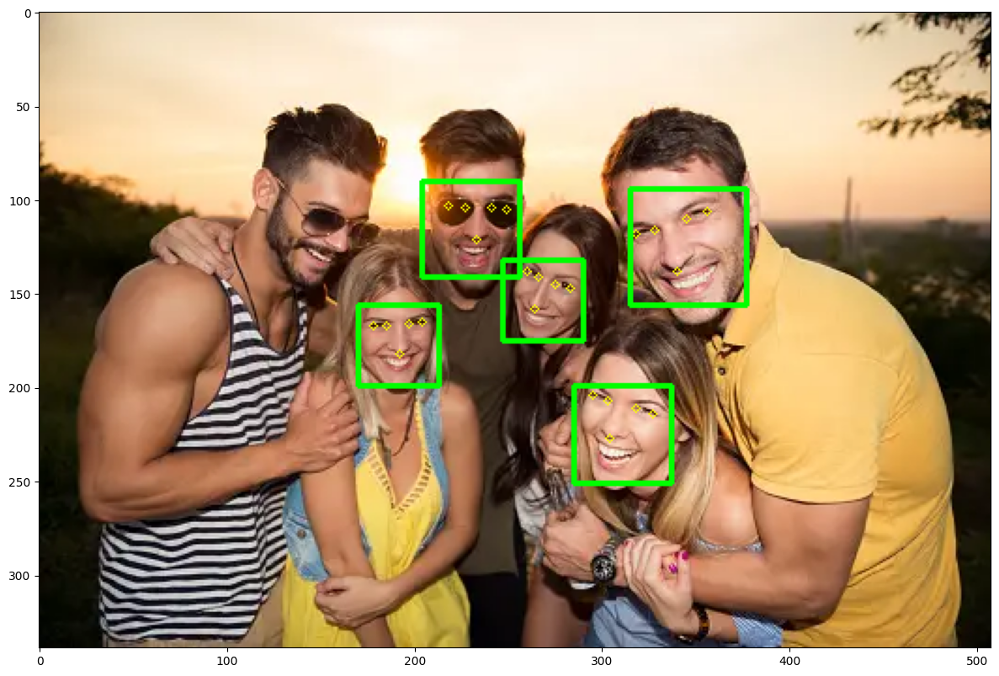

In [19]:
# points_5_detector

figure(figsize=(15, 10), dpi=100)

image = cv2.imread('./images/CV/people1.webp')

face_detections = face_detector(image, 1)

for face_detection in face_detections:
    face_points = points_5_detector(image, face_detection)
    for face_point in face_points.parts():
        cv2.circle(image, (face_point.x, face_point.y), 2, (0, 255, 255))
        left, top, right, bottom = face_detection.left(), face_detection.top(), face_detection.right(), face_detection.bottom()
        cv2.rectangle(image, (left, top), (right, bottom), (0, 255, 0), 2)
        
# cv2_imshow(image)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

## 4. Detect Facial Points with all train data from Yale Face Dataset

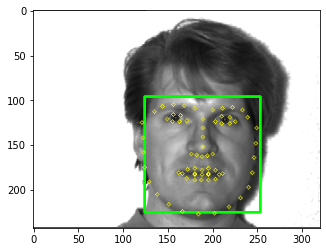

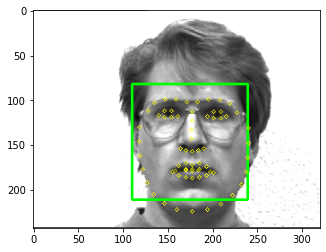

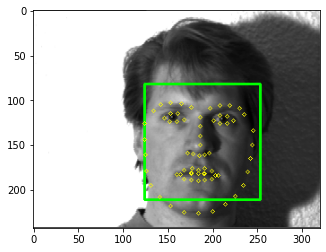

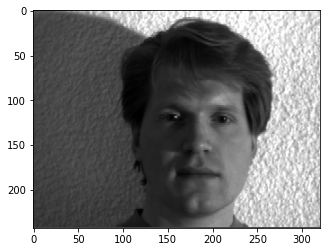

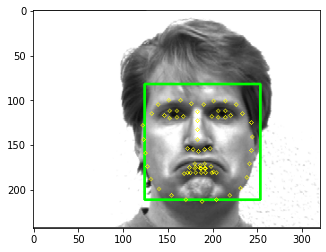

...

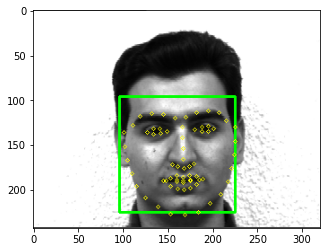

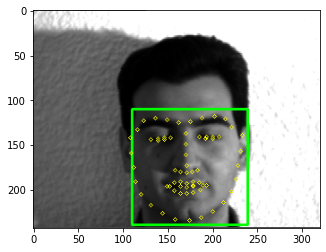

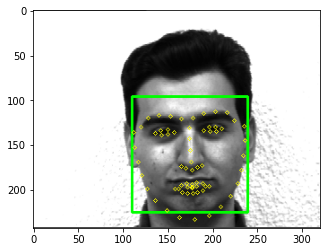

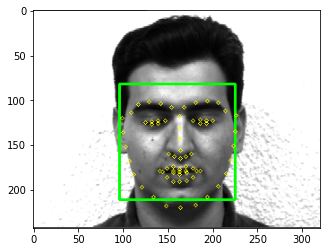

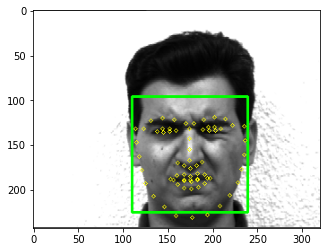

In [21]:
import os

face_descriptor_extractor = dlib.face_recognition_model_v1('./cv_data/dlib_face_recognition_resnet_model_v1.dat')

index = {}
all_face_descript_vectors = None

for idx, train_image_path in enumerate(all_train_image_paths):
    image = Image.open(train_image_path).convert('RGB')
    image_np = np.array(image, 'uint8')  # convert the image type to a numpy array type (with integer format)
    face_detections = face_detector(image_np, 1)

    for face_detection in face_detections:
        left, top, right, bottom = face_detection.left(), face_detection.top(), face_detection.right(), face_detection.bottom()
        cv2.rectangle(image_np, (left, top), (right, bottom), (0, 255, 0), 2)  # draw face bounding-boxes

        face_points = points_68_detector(image_np, face_detection)
        for face_point in face_points.parts():
            cv2.circle(image_np, (face_point.x, face_point.y), 2, (0, 255, 255))  # draw facial points circles

        # Delivering face_points returns 128 features that best represent a face.
        # Type of face_descript_vectors is <class 'dlib.vector'>
        # len(face_descriptor) is 128
        face_descript_vectors = face_descriptor_extractor.compute_face_descriptor(image_np, face_points)
        face_descript_vectors = [vector for vector in face_descript_vectors]
        face_descript_vectors = np.asarray(face_descript_vectors, dtype=np.float64)  # Change list to array
        # Convert the shape of face_descript_vectors with the original shape (128,) into (1,128)
        face_descript_vectors = face_descript_vectors[np.newaxis, :]  

    if all_face_descript_vectors is None:
        all_face_descript_vectors = face_descript_vectors
    else:
        all_face_descript_vectors = np.concatenate((all_face_descript_vectors, face_descript_vectors), axis=0)

    index[idx] = train_image_path
#     cv2_imshow(image_np)
    plt.imshow(cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB))
    plt.show()

In [22]:
all_face_descript_vectors.shape

(125, 128)

- There are 125 images, and each image has 128 values (features).

In [23]:
# all_face_descript_vectors

In [24]:
len(index)

125

In [25]:
# index

## 4. Calculate the Distance Betwwen Faces


In [26]:
all_face_descript_vectors[0]

array([-0.2292136 ,  0.12574784, -0.03663295, -0.09163089, -0.18445356,
        0.03567937, -0.0787802 , -0.06778667,  0.04279399, -0.07578783,
        0.18703955, -0.08775761, -0.33797237, -0.08932292, -0.00702313,
        0.17516127, -0.05562856, -0.08960868, -0.16881314, -0.10423967,
       -0.02874849,  0.01076573,  0.04480223,  0.02879392, -0.10644235,
       -0.29649571, -0.10634424, -0.02541852,  0.00662589, -0.13165644,
       -0.01559289,  0.00447541, -0.21136481, -0.05773918, -0.02534172,
        0.09256969, -0.15663268, -0.09665076,  0.16329011,  0.0472518 ,
       -0.13379991, -0.01590075,  0.0726209 ,  0.23900487,  0.22030941,
        0.01080586,  0.01219016, -0.03076652,  0.09096105, -0.2839849 ,
        0.03025224,  0.157998  ,  0.13379286,  0.08138005,  0.05047057,
       -0.05357284,  0.03272802,  0.21294419, -0.16630001,  0.01760734,
        0.04454346, -0.07495393, -0.13278325, -0.1165058 ,  0.24368219,
        0.20089048, -0.13502254, -0.13845469,  0.22994228, -0.08

In [27]:
len(all_face_descript_vectors[0])

128

- It refers to 128 feature values representing one face. 
- Faces close to this feature value are the same faces.


In [29]:
np.linalg.norm(all_face_descript_vectors[0] - all_face_descript_vectors[0])

0.0

- We calculated the same vector-to-vector distance, so we get 0.0.

In [30]:
np.linalg.norm(all_face_descript_vectors[0] - all_face_descript_vectors[1])

0.49696838724772324

In [31]:
# Calculate the distance between the 0th face vector and all other face vectors
np.linalg.norm(all_face_descript_vectors[0] - all_face_descript_vectors[1:], axis=1)

array([0.49696839, 0.42460962, 0.42460962, 0.47680331, 0.46131101,
       0.47362237, 0.42547436, 0.7196219 , 0.73788224, 0.71955907,
       0.74062755, 0.69095348, 0.65961114, 0.64673616, 0.67704581,
       0.77746125, 0.77381211, 0.73677174, 0.71800882, 0.6974144 ,
       0.71409884, 0.69584914, 0.75120557, 0.83333662, 0.81434977,
       0.82092424, 0.82103563, 0.81891267, 0.86279105, 0.83726408,
       0.82239278, 0.60985478, 0.73327913, 0.638669  , 0.66057667,
       0.61967673, 0.68248535, 0.67497132, 0.63958709, 0.77100705,
       0.68488072, 0.76803987, 0.84708818, 0.83515427, 0.70893883,
       0.76542638, 0.71466986, 0.76974476, 0.81376345, 0.85795448,
       0.83921274, 0.8833442 , 0.8060705 , 0.82673347, 0.75048202,
       0.75482383, 0.70556873, 0.82831224, 0.69975557, 0.74985882,
       0.7751399 , 0.64585573, 0.74922998, 0.70789823, 0.77251354,
       0.71312309, 0.68302189, 0.72836226, 0.72078362, 0.72854392,
       0.71129619, 0.87042087, 0.9403031 , 0.91465365, 0.89122

In [32]:
np.argmin(np.linalg.norm(all_face_descript_vectors[0] - all_face_descript_vectors[1:], axis=1))

1

In [33]:
np.linalg.norm(all_face_descript_vectors[0] - all_face_descript_vectors[1:], axis=1)[81]

0.7268371586367427

## 5. Detect Faces with Dlib


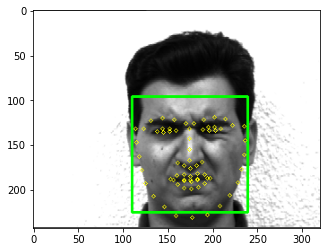

In [35]:
test_image_path = './images/CV/Yale_Face/test'
all_test_image_file_name = os.listdir(test_image_path)
all_test_image_paths = [os.path.join(test_image_path, f) for f in all_test_image_file_name]

if all_face_descript_vectors is None:
    all_face_descript_vectors = face_descript_vectors
else:
    all_face_descript_vectors = np.concatenate((all_face_descript_vectors, face_descript_vectors), axis=0)

index[idx] = train_image_path
# cv2_imshow(image_np)
plt.imshow(cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB))
plt.show()

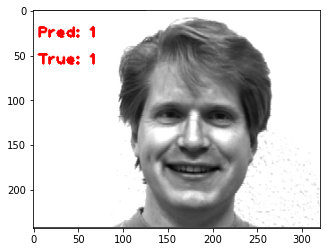

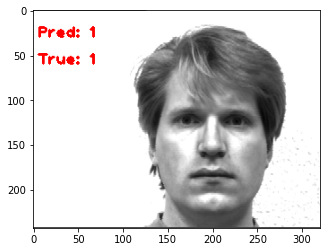

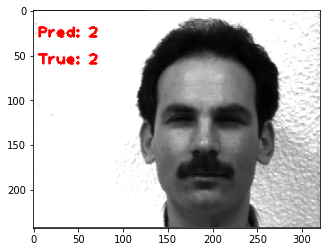

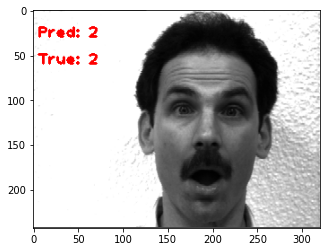

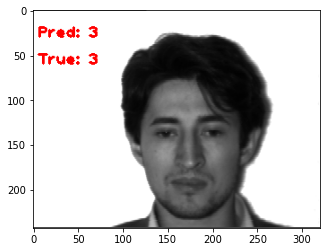

...

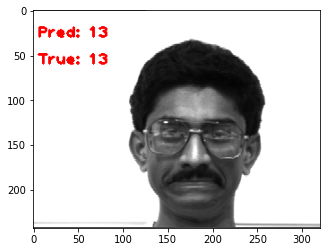

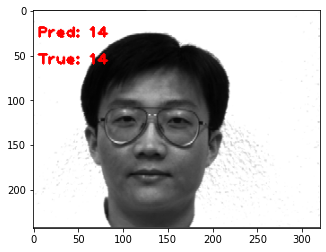

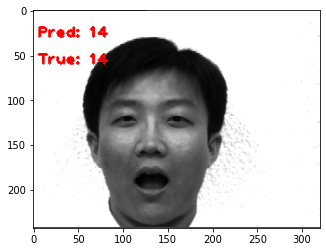

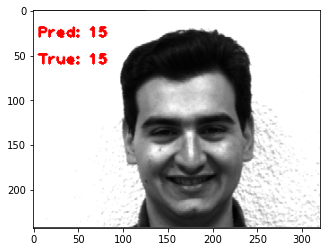

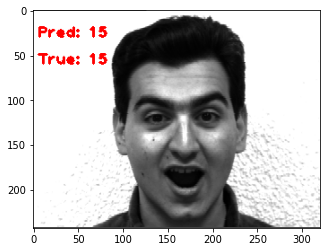

In [36]:
threshold = 0.5
ids_pred = []
ids_true = []

for test_image_path in all_test_image_paths:
    image = Image.open(test_image_path).convert('RGB')
    image_np = np.array(image, 'uint8')

    face_detections = face_detector(image_np, 1)

    for face_detection in face_detections:
        face_points = points_68_detector(image_np, face_detection)

        face_descript_vectors = face_descriptor_extractor.compute_face_descriptor(image_np, face_points)

        face_descript_vectors = [vector for vector in face_descript_vectors]
        face_descript_vectors = np.asarray(face_descript_vectors, dtype=np.float64)
        face_descript_vectors = face_descript_vectors[np.newaxis, :]

        distances = np.linalg.norm(face_descript_vectors - all_face_descript_vectors, axis=1)
        min_index = np.argmin(distances)
        min_distance = distances[min_index]
        if min_distance <= threshold:
            id_pred = int(os.path.split(index[min_index])[1].split('.')[0].replace('subject', ''))
        else:
            id_pred = 1000

        id_true = int(os.path.split(test_image_path)[1].split('.')[0].replace('subject', ''))

        ids_pred.append(id_pred)
        ids_true.append(id_true)

        cv2.putText(image_np, f'Pred: {str(id_pred)}', (5, 30), cv2.FONT_HERSHEY_PLAIN, 1.1, (0, 0, 255), 2)
        cv2.putText(image_np, f'True: {str(id_true)}', (5, 60), cv2.FONT_HERSHEY_PLAIN, 1.1, (0, 0, 255), 2)

#     cv2_imshow(image_np)
    plt.imshow(cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB))
    plt.show()

In [37]:
from sklearn.metrics import accuracy_score

accuracy_score(ids_pred, ids_true)

0.896551724137931